## NFL Big Data Bowl

<a id="1"></a> <br>
# Importing Libraries and Loading Dataset

In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly as py
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True) 

import warnings
warnings.filterwarnings('ignore')

In [2]:
df_train = pd.read_csv('../input/nfl-big-data-bowl-2020/train.csv', low_memory=False)

In [3]:
print("Total Row Number: {0} \nTotal Col Number: {1}".format(df_train.shape[0], df_train.shape[1]))

Total Row Number: 509762 
Total Col Number: 49


In [4]:
df_train.head()

,GameId,PlayId,Team,X,Y,S,A,Dis,Orientation,Dir,...,Week,Stadium,Location,StadiumType,Turf,GameWeather,Temperature,Humidity,WindSpeed,WindDirection
0,2017090700,20170907000118,away,73.91,34.84,1.69,1.13,0.40,81.99,177.18,...,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8,SW
1,2017090700,20170907000118,away,74.67,32.64,0.42,1.35,0.01,27.61,198.70,...,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8,SW
2,2017090700,20170907000118,away,74.00,33.20,1.22,0.59,0.31,3.01,202.73,...,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8,SW
3,2017090700,20170907000118,away,71.46,27.70,0.42,0.54,0.02,359.77,105.64,...,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8,SW
4,2017090700,20170907000118,away,69.32,35.42,1.82,2.43,0.16,12.63,164.31,...,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8,SW


In [5]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 509762 entries, 0 to 509761
Data columns (total 49 columns):
GameId                    509762 non-null int64
PlayId                    509762 non-null int64
Team                      509762 non-null object
X                         509762 non-null float64
Y                         509762 non-null float64
S                         509762 non-null float64
A                         509762 non-null float64
Dis                       509762 non-null float64
Orientation               509744 non-null float64
Dir                       509748 non-null float64
NflId                     509762 non-null int64
DisplayName               509762 non-null object
JerseyNumber              509762 non-null int64
Season                    509762 non-null int64
YardLine                  509762 non-null int64
Quarter                   509762 non-null int64
GameClock                 509762 non-null object
PossessionTeam            509762 non-null object
Down   

In [6]:
df_train.columns

Index(['GameId', 'PlayId', 'Team', 'X', 'Y', 'S', 'A', 'Dis', 'Orientation',
       'Dir', 'NflId', 'DisplayName', 'JerseyNumber', 'Season', 'YardLine',
       'Quarter', 'GameClock', 'PossessionTeam', 'Down', 'Distance',
       'FieldPosition', 'HomeScoreBeforePlay', 'VisitorScoreBeforePlay',
       'NflIdRusher', 'OffenseFormation', 'OffensePersonnel',
       'DefendersInTheBox', 'DefensePersonnel', 'PlayDirection', 'TimeHandoff',
       'TimeSnap', 'Yards', 'PlayerHeight', 'PlayerWeight', 'PlayerBirthDate',
       'PlayerCollegeName', 'Position', 'HomeTeamAbbr', 'VisitorTeamAbbr',
       'Week', 'Stadium', 'Location', 'StadiumType', 'Turf', 'GameWeather',
       'Temperature', 'Humidity', 'WindSpeed', 'WindDirection'],
      dtype='object')

There are 49 columns and 11 columns have null values. Total null values of these are below:

In [7]:
nullvalues = df_train.loc[:, df_train.isnull().any()].isnull().sum().sort_values(ascending=False)

print(nullvalues)

WindDirection        80234
WindSpeed            67430
Temperature          48532
GameWeather          43648
StadiumType          32934
FieldPosition         6424
Humidity              6160
OffenseFormation       110
DefendersInTheBox       66
Orientation             18
Dir                     14
dtype: int64


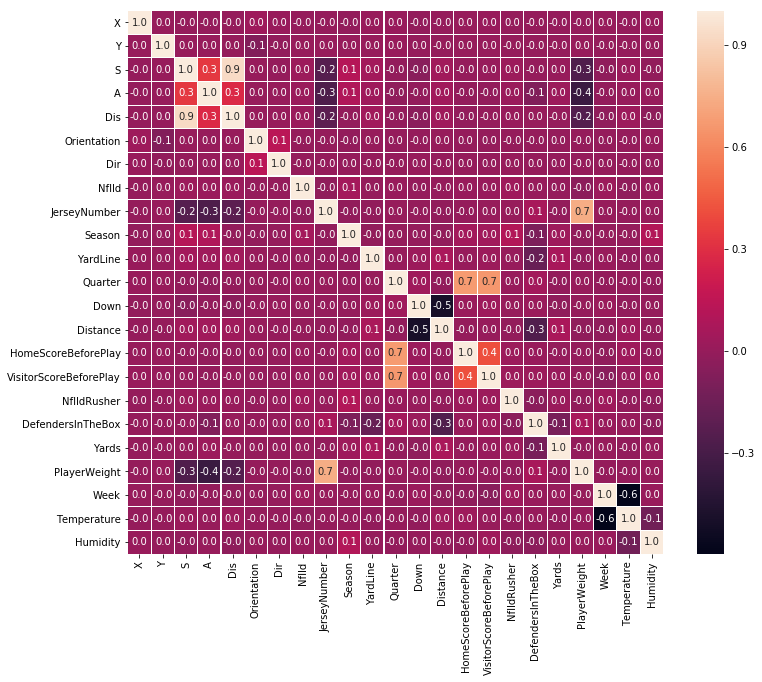

In [8]:
#i'll ignore to ids.
f,ax = plt.subplots(figsize=(12,10))
sns.heatmap(df_train.iloc[:,2:].corr(),annot=True, linewidths=.1, fmt='.1f', ax=ax)

plt.show()

There are a close relationship between S and Dis. There are also a relationship between JerseyNumber and PlayerWeight. 

<a id="3"></a> <br>
# Data Visualization

In [9]:
unique_plays = df_train.groupby('Season').agg({'PlayId': 'nunique', 'GameId': 'nunique', 'NflId':'nunique'})
unique_plays.columns = ["PlayCount","GameCount", "PlayerCount"]

print(unique_plays)

        PlayCount  GameCount  PlayerCount
Season                                   
2017        11900        256         1788
2018        11271        256         1783


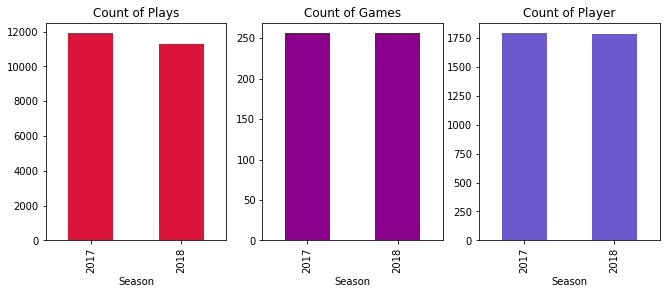

In [10]:
f,ax=plt.subplots(1,3,figsize=(11,4))
unique_plays["PlayCount"].plot(ax=ax[0],color='crimson', kind='bar')

ax[0].set_title('Count of Plays')
unique_plays["GameCount"].plot(ax=ax[1],color='darkmagenta', kind='bar')

ax[1].set_title('Count of Games')
unique_plays["PlayerCount"].plot(ax=ax[2],color='slateblue', kind='bar')

ax[2].set_title('Count of Player')

plt.show()

In [12]:
df_player = df_train.loc[:,['NflId', 'DisplayName', 'PlayerBirthDate', 'PlayerWeight', 'PlayerHeight', 'PlayerCollegeName']].drop_duplicates()

df_player["HeightFt"] = df_player["PlayerHeight"].str.split('-', expand=True)[0].astype(int)
df_player["HeightIn"] = df_player["PlayerHeight"].str.split('-', expand=True)[1].astype(int)
df_player["HeightCm"] = df_player["HeightFt"]*30.48 + df_player["HeightIn"]*2.54

df_player["WeightKg"] = df_player["PlayerWeight"]*0.45359237

df_height = df_player.groupby(['PlayerHeight','HeightFt','HeightIn']).size().reset_index().sort_values(["HeightFt", "HeightIn"])

df_height.columns = ["PlayerHeight","HeightFt","HeightIn","Count"]

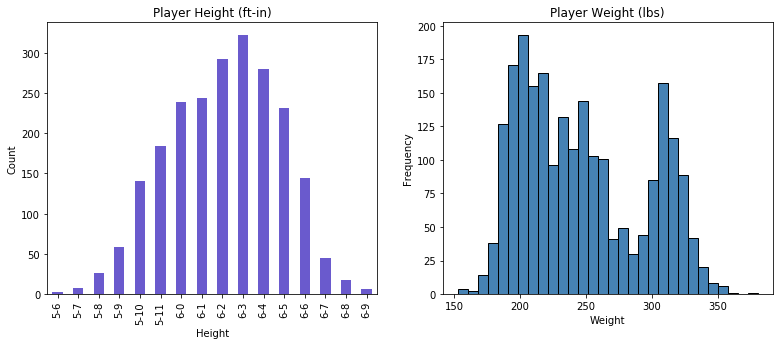

In [13]:
f,ax=plt.subplots(1,2,figsize=(13,5))
df_height.loc[:,["PlayerHeight","Count"]].set_index("PlayerHeight").plot(ax=ax[0],color='slateblue', kind='bar')

ax[0].set_xlabel("Height") 
ax[0].set_ylabel("Count") 
ax[0].get_legend().remove()
ax[0].set_title('Player Height (ft-in)')

df_player.PlayerWeight.plot.hist(ax=ax[1],bins=30,edgecolor='black',color='steelblue')

ax[1].set_xlabel("Weight") 
ax[1].set_title('Player Weight (lbs)')

plt.show()

In [16]:
df_player['BirthDate'] = df_player['PlayerBirthDate'].astype('datetime64[ns]')

#df_train["TimeSnap"].astype('datetime64[ns]').sort_values(ascending=False)
#max date in TimeSnap cloumn is 2018-12-31, so i'm not using today function

df_player['MaxDate'] = pd.to_datetime('2018-12-31')

df_player['Age'] = round((df_player['MaxDate'] - df_player['BirthDate'])/np.timedelta64(1,'D')/365.25,1)

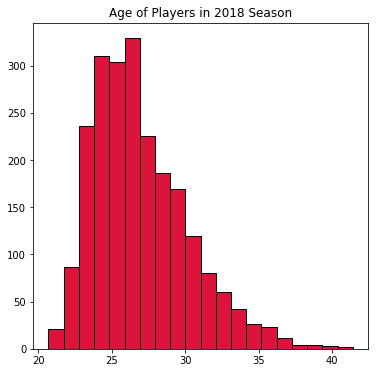

In [17]:
plt.figure(figsize=(6,6))

plt.hist(df_player["Age"], bins=20 ,edgecolor='black', color='crimson')
plt.title("Age of Players in 2018 Season")

plt.show()

In [23]:
df_Off = df_train.loc[:,["PlayId","OffensePersonnel"]].drop_duplicates()
df_Off["OffensePersonnel"] = df_Off["OffensePersonnel"].str.replace(",1", ", 1")
df_Off["OffensePersonnel"] = df_Off["OffensePersonnel"].str.replace(",2", ", 2")
OffenseCount = df_Off["OffensePersonnel"].value_counts()

dic_Offense = {'DL': [0],'LB': [0],'DB': [0],'OL': [0],'RB': [0],'TE': [0],'WR': [0],'QB': [0]}
df_Offense = pd.DataFrame.from_dict(dic_Offense, orient='index')
df_Offense.columns = ["Count"]

for i in OffenseCount.index:
    for j in i.split(", "):
        df_Offense.loc[ j.split(" ")[1] : j.split(" ")[1],:] += int(j.split(" ")[0]) * OffenseCount[i]

In [24]:
colors = ['g', 'b', 'p', 'plum', 'gold', 'mediumturquoise', 'darkorange', 'lightgreen']

fig = go.Figure(data=[go.Pie(labels=df_Offense.index.values.tolist(), 
                             values=df_Offense["Count"].tolist() , hole=.3)])

fig.update_traces(hoverinfo='label+percent', textinfo='value', textfont_size=18,
                  marker=dict(colors=colors, line=dict(color='#000000', width=2)))

fig.update_layout(
    title_text="Offensive Players Ratio in All Plays", height=500, width=700)

fig.show()

In [25]:
df_speed = df_train.loc[:,['DisplayName', 'S']].groupby('DisplayName').mean()
df_speed.columns = ["Average Speed"]
df_speed = df_speed.sort_values("Average Speed", ascending = False)

In [26]:
fig = px.histogram(df_speed, x="Average Speed",
                   title='Average Speed Distribution of Players',
                   opacity=0.8,
                   color_discrete_sequence=['indianred']
                   )

fig.update_layout(
    yaxis_title_text='Count',
    height=500, width=800)

fig.update_traces(marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=0.8
                 )

fig.show()

It seems to, most players have 2 - 2.3 yards/second speed.

In [27]:
df_speed_yards = df_train[df_train["NflIdRusher"] == df_train["NflId"]].loc[:,['GameId', 'DisplayName', 'S', 'Yards']]


fig = go.Figure(data=go.Scattergl
(
    x = df_speed_yards["Yards"], 
    y = df_speed_yards["S"],
    text = df_speed_yards['DisplayName'],
    mode='markers',
    marker=dict(line_width=0.4),
    marker_color='darkorange'))

fig.update_layout(title='Speed to Yards', height=700, width=800)

fig.update_xaxes(title_text="Yards")
fig.update_yaxes(title_text="Speed (yards/second)")

fig.show()

In [28]:
df_MaxSpeed = df_train.loc[:,['DisplayName', 'PlayerBirthDate', 'TimeSnap', 'S', 'Orientation']].groupby(['DisplayName', 'PlayerBirthDate'], as_index=False).max()

df_MaxSpeed["Age"] = round((df_MaxSpeed['TimeSnap'].astype('datetime64[ns]') - df_MaxSpeed['PlayerBirthDate'].astype('datetime64[ns]'))/np.timedelta64(1,'D')/365.25,1)

In [32]:
fig = go.Figure()
yards = [d1, d2, d3, d4, d5, d6, d7, d8, d9, d10, d11]
tags = ["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11"]

for index, category in enumerate(yards):
    fig.add_trace(go.Box(y=category, name=tags[index]))
    
fig.update_layout(autosize=False, width=800,height=500,showlegend=False,
                  title="Yards and Number of Defenders in the Box Correlation", 
                  yaxis=dict(title="Yards"), 
                  xaxis=dict(title="Number of Players"),
                  paper_bgcolor='rgb(243, 243, 243)', 
                  plot_bgcolor='rgb(243, 243, 243)', 
                  margin=dict(l=40,r=30,b=80,t=100,)
                 )

fig.show()

If we zoom in on the chart, a regular distribution appears as follows.

<img src="https://i.ibb.co/WfCg2Ny/kaggle-NFL.png" width="800"> 